# **Midterm Exam**
## Submitted by: Franch Lee D. Bataan


---

In [ ]:
#Importing Libraries Needed
import torch
import torch.nn as nn
import torchvision.transforms as tv
import matplotlib.pyplot as plt
import os
import torch.nn.functional as Func
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid
from torchvision.utils import save_image
from tqdm import tqdm
%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from zipfile import ZipFile
with ZipFile('/content/drive/MyDrive/Python/Anime Dataset.zip', 'r') as zipObj:
    zipObj.extractall('/content/drive/MyDrive/Python')

In [ ]:
def get_default_device():
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
def to_device(data, device):
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

In [ ]:
class DeviceDataLoader():
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device 
    def __iter__(self):
        for b in self.dl: 
            yield to_device(b, self.device)
    def __len__(self):
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
#Setting image parameters
img_size= 64
batch_size= 128
config= (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)
train_ds= ImageFolder("/content/drive/MyDrive/Python", 
transform=tv.Compose([tv.Resize(img_size),tv.CenterCrop(img_size),tv.ToTensor(),tv.Normalize(*config)]))
train_dl= DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:566: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


In [ ]:
#Denormalize image tensors
def denorm(img_tensors):
    return img_tensors * config[1][0] + config[0][0]

In [ ]:
def display_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

In [ ]:
def show_batch(dl, nmax=64):
    for images, _ in dl:
        display_images(images, nmax)
        break

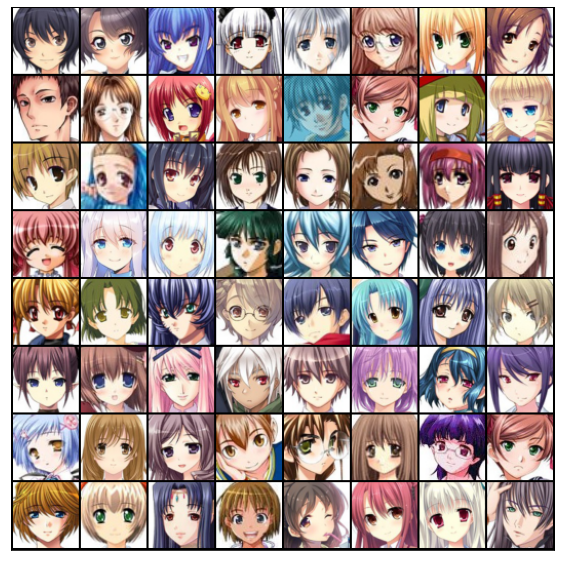

In [ ]:
#Displaying Images from dataset
show_batch(train_dl)

In [ ]:
train_dl= DeviceDataLoader(train_dl, device)

In [ ]:
#Building a discriminator network
discriminator = nn.Sequential(
    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),nn.Flatten(),nn.Sigmoid())

In [ ]:
#Building a Generator Network
latent_size= 128
generator= nn.Sequential(
    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512), nn.ReLU(True),
    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256), nn.ReLU(True),
    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128), nn.ReLU(True),
    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64), nn.ReLU(True),
    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
)

In [ ]:
#Shape of each generator
X= torch.randn(size=(1, 128, 1, 1))
for layer in generator:
    X = layer(X)
    print(layer.__class__.__name__,'output shape:\t',X.shape)

ConvTranspose2d output shape:	 torch.Size([1, 512, 4, 4])
BatchNorm2d output shape:	 torch.Size([1, 512, 4, 4])
ReLU output shape:	 torch.Size([1, 512, 4, 4])
ConvTranspose2d output shape:	 torch.Size([1, 256, 8, 8])
BatchNorm2d output shape:	 torch.Size([1, 256, 8, 8])
ReLU output shape:	 torch.Size([1, 256, 8, 8])
ConvTranspose2d output shape:	 torch.Size([1, 128, 16, 16])
BatchNorm2d output shape:	 torch.Size([1, 128, 16, 16])
ReLU output shape:	 torch.Size([1, 128, 16, 16])
ConvTranspose2d output shape:	 torch.Size([1, 64, 32, 32])
BatchNorm2d output shape:	 torch.Size([1, 64, 32, 32])
ReLU output shape:	 torch.Size([1, 64, 32, 32])
ConvTranspose2d output shape:	 torch.Size([1, 3, 64, 64])
Tanh output shape:	 torch.Size([1, 3, 64, 64])


torch.Size([128, 3, 64, 64])


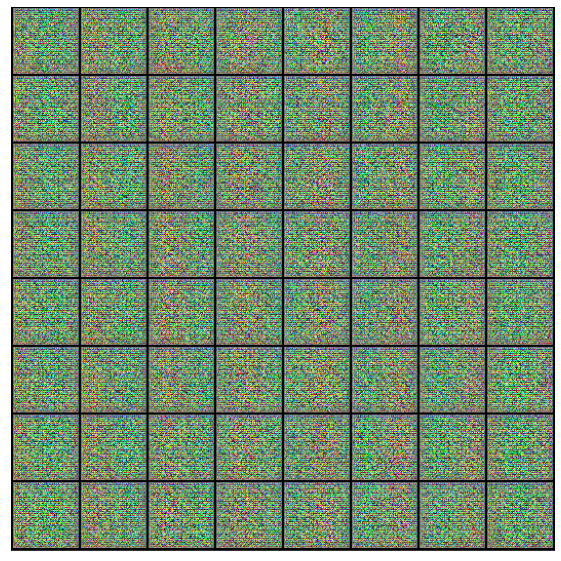

In [ ]:
#Displaying images generated by generator
pre_output = torch.randn(batch_size, latent_size, 1, 1) 
generate_img= generator(pre_output)
print(generate_img.shape)
display_images(generate_img)

In [ ]:
#Training discriminator
def train_discriminator(real_images, opt_d):
    opt_d.zero_grad()
    real_preds= discriminator(real_images)
    real_targets= torch.ones(real_images.size(0), 1, device=device)
    real_loss= Func.binary_cross_entropy(real_preds, real_targets)
    real_score= torch.mean(real_preds).item()
    #Generate image
    latent= torch.randn(batch_size, latent_size, 1, 1, device=device)
    gen_img= generator(latent)
    gen_targets= torch.zeros(gen_img .size(0), 1,  device=device)
    gen_prediction= discriminator(gen_img)
    gen_loss= Func.binary_cross_entropy(gen_prediction, gen_targets)
    gen_score= torch.mean(gen_prediction).item()
    loss= real_loss + gen_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, gen_score

In [ ]:
#Training generator
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()
    latent= torch.randn(batch_size, latent_size, 1, 1,  device=device)
    gen_img= generator(latent)
    preds= discriminator(gen_img )
    targets= torch.ones(batch_size, 1,  device=device)
    loss= Func.binary_cross_entropy(preds, targets)
    loss.backward()
    opt_g.step()
    return loss.item()

In [ ]:
discriminator = to_device(discriminator, device)

In [ ]:
generator = to_device(generator, device)

In [ ]:
#Folder for generated outputs
output_path= 'Generated Waifus'
os.makedirs(output_path, exist_ok=True)

In [ ]:
def save_samples(index, latent_tensors, show=True):
    gen_img= generator(latent_tensors)
    fake_fname= 'Generated_Image-{0:0=4d}.png'.format(index)
    save_image(denorm(gen_img ), os.path.join(output_path, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
        fig, ax = plt.subplots(figsize=(10, 10))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(gen_img .cpu().detach(), nrow=8).permute(1, 2, 0))

In [ ]:
fixed_latent= torch.randn(64, latent_size, 1, 1,  device=device)

Saving Generated_Image-0000.png


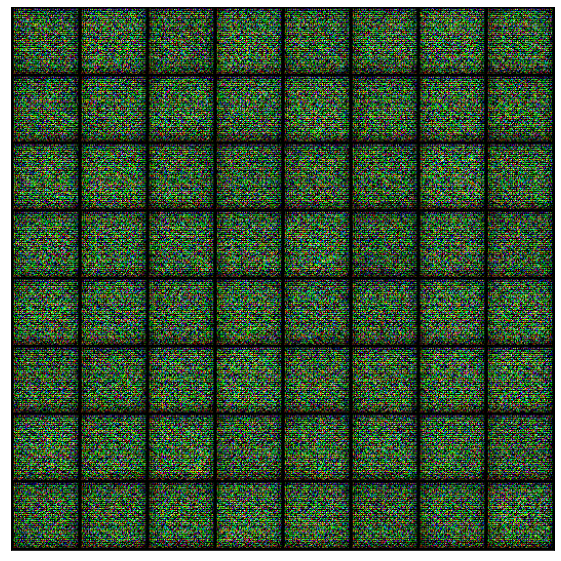

In [ ]:
save_samples(0, fixed_latent)

In [ ]:
#fitting the model 
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()
    losses_g= []
    losses_d= []
    real_scores= []
    gen_scores= []
    # Create optimizers
    opt_d= torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g= torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999)) 
    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            loss_d, real_score, gen_score= train_discriminator(real_images, opt_d)
            loss_g = train_generator(opt_g)
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        gen_scores.append(gen_score)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, gen_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, gen_score))
        save_samples(epoch+start_idx, fixed_latent, show=False)
    return losses_g, losses_d, real_scores, gen_scores

In [ ]:
lr = 0.0002
epochs = 50

In [ ]:
#Generate Output
history= fit(epochs, lr)

100%|██████████| 497/497 [02:06<00:00,  3.92it/s]


Epoch [1/50], loss_g: 6.8548, loss_d: 0.4012, real_score: 0.9576, gen_score: 0.2530
Saving Generated_Image-0001.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [2/50], loss_g: 9.2255, loss_d: 0.4190, real_score: 0.9965, gen_score: 0.2911
Saving Generated_Image-0002.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [3/50], loss_g: 5.9426, loss_d: 0.2175, real_score: 0.9561, gen_score: 0.1362
Saving Generated_Image-0003.png


100%|██████████| 497/497 [02:06<00:00,  3.94it/s]


Epoch [4/50], loss_g: 3.3049, loss_d: 0.3020, real_score: 0.8617, gen_score: 0.0955
Saving Generated_Image-0004.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [5/50], loss_g: 5.0345, loss_d: 0.0879, real_score: 0.9986, gen_score: 0.0755
Saving Generated_Image-0005.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [6/50], loss_g: 3.4624, loss_d: 0.2050, real_score: 0.8849, gen_score: 0.0548
Saving Generated_Image-0006.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [7/50], loss_g: 5.9509, loss_d: 0.1136, real_score: 0.9254, gen_score: 0.0269
Saving Generated_Image-0007.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [8/50], loss_g: 5.0227, loss_d: 0.0954, real_score: 0.9527, gen_score: 0.0416
Saving Generated_Image-0008.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [9/50], loss_g: 2.7455, loss_d: 0.2262, real_score: 0.8629, gen_score: 0.0500
Saving Generated_Image-0009.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [10/50], loss_g: 4.0682, loss_d: 0.1798, real_score: 0.8911, gen_score: 0.0524
Saving Generated_Image-0010.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [11/50], loss_g: 4.0232, loss_d: 0.2128, real_score: 0.9399, gen_score: 0.1234
Saving Generated_Image-0011.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [12/50], loss_g: 2.6350, loss_d: 0.1996, real_score: 0.8533, gen_score: 0.0241
Saving Generated_Image-0012.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [13/50], loss_g: 4.1358, loss_d: 0.0979, real_score: 0.9454, gen_score: 0.0381
Saving Generated_Image-0013.png


100%|██████████| 497/497 [02:05<00:00,  3.94it/s]


Epoch [14/50], loss_g: 4.0918, loss_d: 0.1041, real_score: 0.9644, gen_score: 0.0613
Saving Generated_Image-0014.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [15/50], loss_g: 4.7343, loss_d: 0.3833, real_score: 0.9239, gen_score: 0.2171
Saving Generated_Image-0015.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [16/50], loss_g: 3.6303, loss_d: 0.1353, real_score: 0.9318, gen_score: 0.0553
Saving Generated_Image-0016.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [17/50], loss_g: 2.6786, loss_d: 0.1041, real_score: 0.9309, gen_score: 0.0280
Saving Generated_Image-0017.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [18/50], loss_g: 4.3859, loss_d: 0.1012, real_score: 0.9460, gen_score: 0.0401
Saving Generated_Image-0018.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [19/50], loss_g: 1.5978, loss_d: 0.4036, real_score: 0.7192, gen_score: 0.0134
Saving Generated_Image-0019.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [20/50], loss_g: 4.0993, loss_d: 0.1305, real_score: 0.9555, gen_score: 0.0728
Saving Generated_Image-0020.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [21/50], loss_g: 3.7641, loss_d: 0.1771, real_score: 0.8744, gen_score: 0.0224
Saving Generated_Image-0021.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [22/50], loss_g: 6.7222, loss_d: 0.0688, real_score: 0.9506, gen_score: 0.0147
Saving Generated_Image-0022.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [23/50], loss_g: 0.2315, loss_d: 1.0099, real_score: 0.4444, gen_score: 0.0018
Saving Generated_Image-0023.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [24/50], loss_g: 2.5021, loss_d: 0.1597, real_score: 0.8979, gen_score: 0.0352
Saving Generated_Image-0024.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [25/50], loss_g: 4.7819, loss_d: 0.1666, real_score: 0.9391, gen_score: 0.0831
Saving Generated_Image-0025.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [26/50], loss_g: 3.7670, loss_d: 0.2366, real_score: 0.8649, gen_score: 0.0626
Saving Generated_Image-0026.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [27/50], loss_g: 3.6243, loss_d: 0.2477, real_score: 0.9171, gen_score: 0.1345
Saving Generated_Image-0027.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [28/50], loss_g: 4.7453, loss_d: 0.1863, real_score: 0.8993, gen_score: 0.0528
Saving Generated_Image-0028.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [29/50], loss_g: 5.1121, loss_d: 0.0702, real_score: 0.9596, gen_score: 0.0255
Saving Generated_Image-0029.png


100%|██████████| 497/497 [02:04<00:00,  3.98it/s]


Epoch [30/50], loss_g: 4.7554, loss_d: 0.1103, real_score: 0.9645, gen_score: 0.0646
Saving Generated_Image-0030.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [31/50], loss_g: 3.5881, loss_d: 0.1764, real_score: 0.8822, gen_score: 0.0226
Saving Generated_Image-0031.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [32/50], loss_g: 5.2805, loss_d: 0.0550, real_score: 0.9672, gen_score: 0.0192
Saving Generated_Image-0032.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [33/50], loss_g: 5.9905, loss_d: 0.1124, real_score: 0.9934, gen_score: 0.0895
Saving Generated_Image-0033.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [34/50], loss_g: 5.6180, loss_d: 0.0474, real_score: 0.9760, gen_score: 0.0217
Saving Generated_Image-0034.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [35/50], loss_g: 3.5111, loss_d: 0.1004, real_score: 0.9381, gen_score: 0.0293
Saving Generated_Image-0035.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [36/50], loss_g: 4.4530, loss_d: 0.0915, real_score: 0.9869, gen_score: 0.0654
Saving Generated_Image-0036.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]


Epoch [37/50], loss_g: 8.8694, loss_d: 1.9513, real_score: 0.9985, gen_score: 0.7318
Saving Generated_Image-0037.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [38/50], loss_g: 5.0678, loss_d: 0.1504, real_score: 0.9558, gen_score: 0.0900
Saving Generated_Image-0038.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [39/50], loss_g: 4.9013, loss_d: 0.6968, real_score: 0.9714, gen_score: 0.3943
Saving Generated_Image-0039.png


100%|██████████| 497/497 [02:05<00:00,  3.96it/s]


Epoch [40/50], loss_g: 1.0419, loss_d: 0.5056, real_score: 0.7079, gen_score: 0.0358
Saving Generated_Image-0040.png


100%|██████████| 497/497 [02:34<00:00,  3.22it/s]


Epoch [41/50], loss_g: 5.1216, loss_d: 0.0324, real_score: 0.9950, gen_score: 0.0256
Saving Generated_Image-0041.png


100%|██████████| 497/497 [02:06<00:00,  3.94it/s]


Epoch [42/50], loss_g: 3.0161, loss_d: 0.2103, real_score: 0.8482, gen_score: 0.0177
Saving Generated_Image-0042.png


100%|██████████| 497/497 [02:04<00:00,  3.98it/s]


Epoch [43/50], loss_g: 5.7949, loss_d: 0.0990, real_score: 0.9671, gen_score: 0.0509
Saving Generated_Image-0043.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [44/50], loss_g: 2.3956, loss_d: 0.0899, real_score: 0.9282, gen_score: 0.0097
Saving Generated_Image-0044.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [45/50], loss_g: 4.8856, loss_d: 0.0899, real_score: 0.9512, gen_score: 0.0342
Saving Generated_Image-0045.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [46/50], loss_g: 4.1122, loss_d: 0.0549, real_score: 0.9573, gen_score: 0.0081
Saving Generated_Image-0046.png


100%|██████████| 497/497 [02:04<00:00,  3.98it/s]


Epoch [47/50], loss_g: 5.9815, loss_d: 0.0320, real_score: 0.9775, gen_score: 0.0086
Saving Generated_Image-0047.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [48/50], loss_g: 2.3009, loss_d: 0.1707, real_score: 0.9783, gen_score: 0.1261
Saving Generated_Image-0048.png


100%|██████████| 497/497 [02:05<00:00,  3.97it/s]


Epoch [49/50], loss_g: 5.4765, loss_d: 0.0408, real_score: 0.9932, gen_score: 0.0319
Saving Generated_Image-0049.png


100%|██████████| 497/497 [02:05<00:00,  3.95it/s]

Epoch [50/50], loss_g: 4.9763, loss_d: 0.0986, real_score: 0.9533, gen_score: 0.0407
Saving Generated_Image-0050.png


In [ ]:
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

In [ ]:
from IPython.display import Image

#### **Generated Image**

---

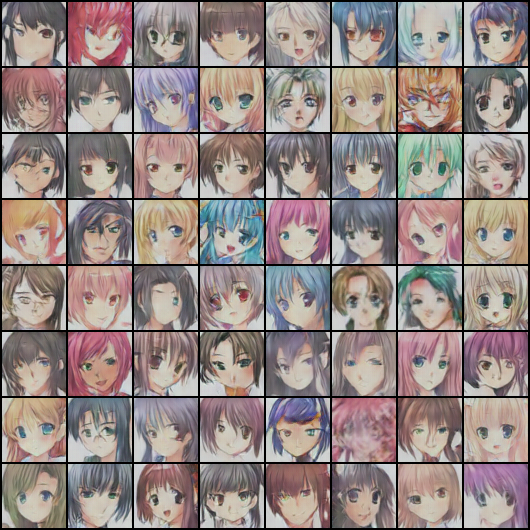

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0000.png')

##### **Generated Image after 5 epochs**

---

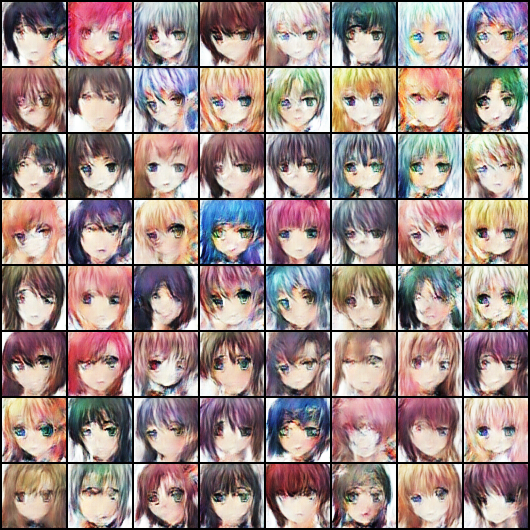

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0005.png')

##### **Generated Image after 10 epochs**

---

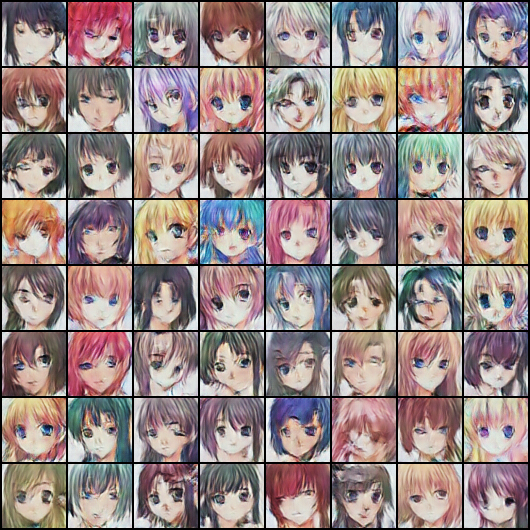

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0010.png')

##### **Generated Image after 15 epochs**

---


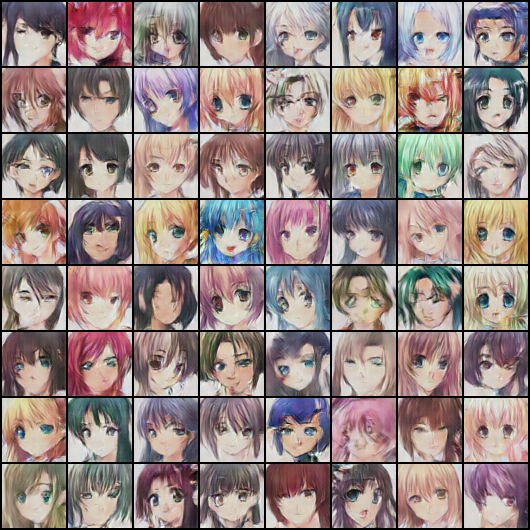

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0015.png')

##### **Generated Image after 20 epochs**

---


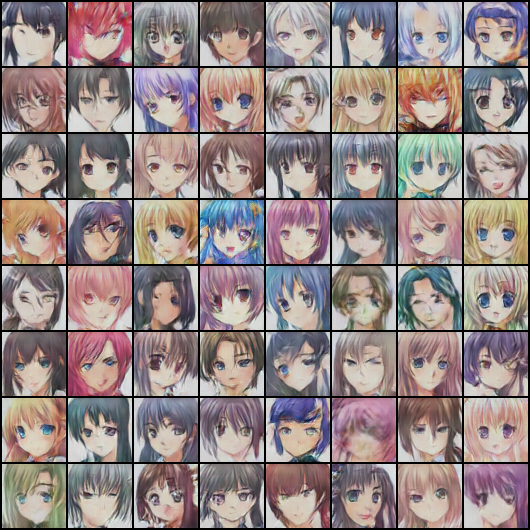

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0020.png')

##### **Generated Image after 25 epochs**

---


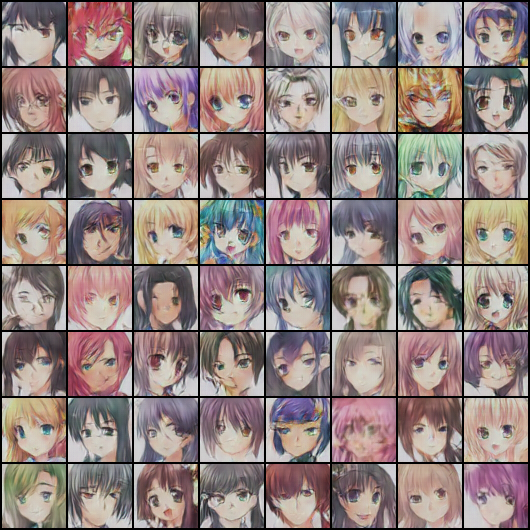

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0025.png')

##### **Generated Image after 30 epochs**

---


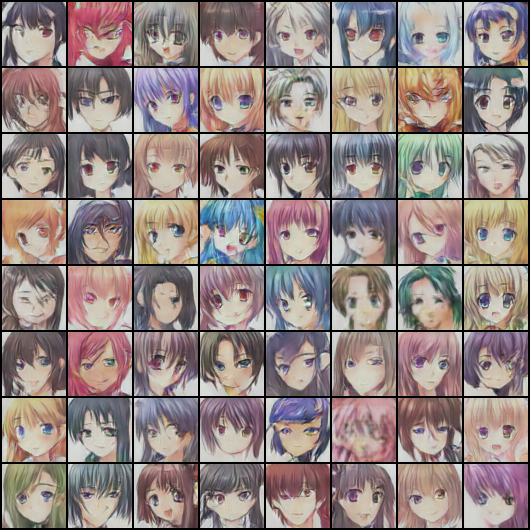

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0030.png')

#####**Generated Image after 35 epochs**

---


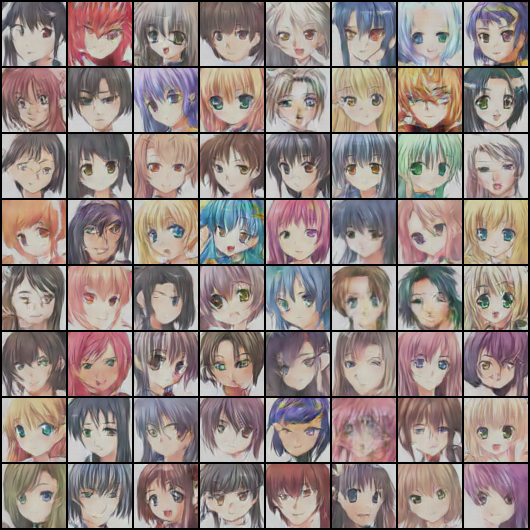

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0035.png')

#####**Generated Image after 40 epochs**

---




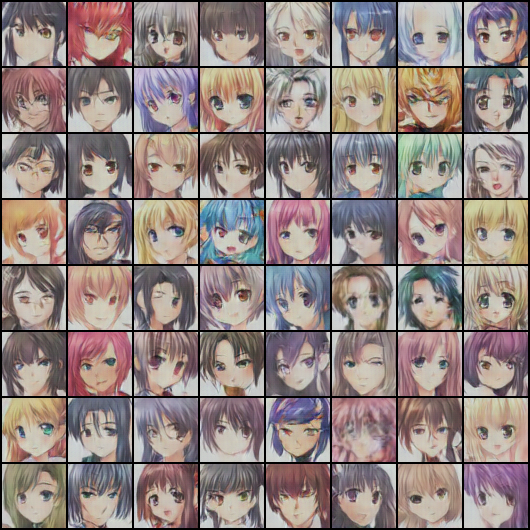

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0040.png')

##### **Generated Image after 45 epochs**

---




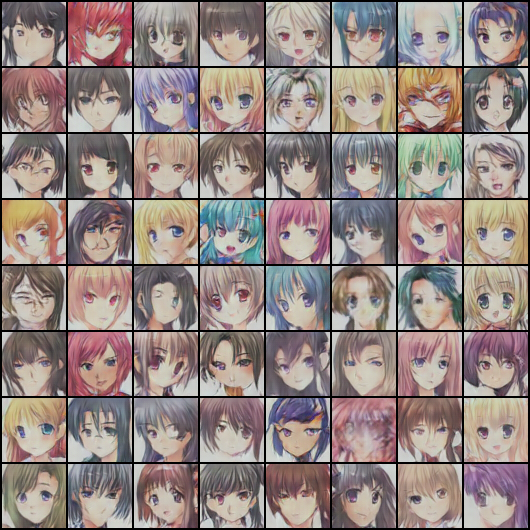

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0045.png')

##### **Generated Image after 50 epochs**



---




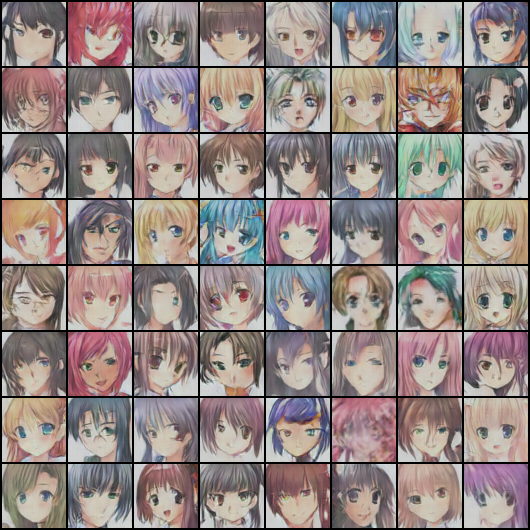

In [ ]:
Image('/content/Generated Waifus/Generated_Image-0050.png')